In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import math

import warnings
warnings.filterwarnings("ignore")

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.datasets import fetch_olivetti_faces, make_moons
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier

---
# Question-1
---

## Preprocessing and Analysis

In [3]:
df = pd.read_csv("glass.csv")
df = df[df.columns[1:]]
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


In [4]:
df.isnull().sum()

RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64

In [5]:
for each in df.columns:
    print('Number of unique entries in', each, ':', len(df[each].unique()))

Number of unique entries in RI : 178
Number of unique entries in Na : 142
Number of unique entries in Mg : 94
Number of unique entries in Al : 118
Number of unique entries in Si : 133
Number of unique entries in K : 65
Number of unique entries in Ca : 143
Number of unique entries in Ba : 34
Number of unique entries in Fe : 32
Number of unique entries in Type : 6


In [6]:
df.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,2.780374
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,2.103739
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,1.000000
25%,1.516522,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,1.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,2.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,3.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,7.000000


In [7]:
features = df.columns.tolist()[:-1]

In [8]:
X = df[features]
y = df['Type']

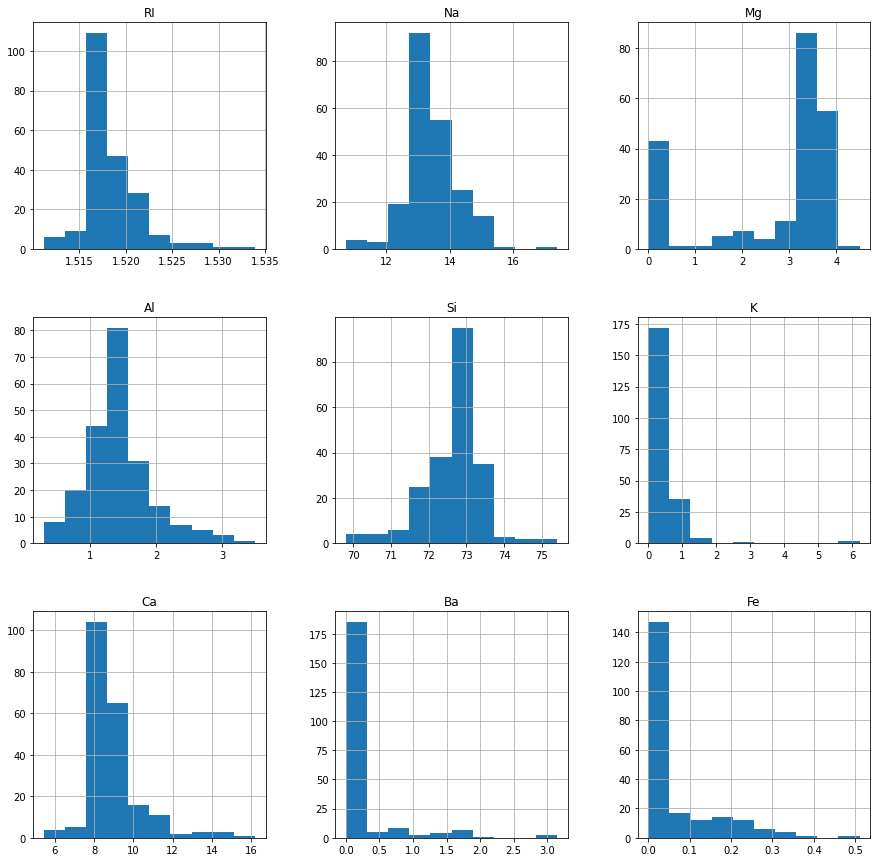

In [9]:
X.hist(figsize=(15,15))
plt.show()

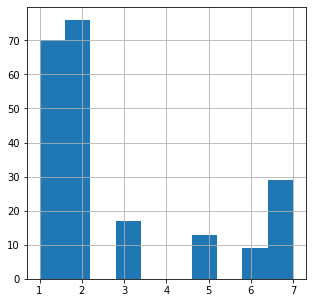

In [10]:
y.hist(figsize=(5,5))
plt.show()

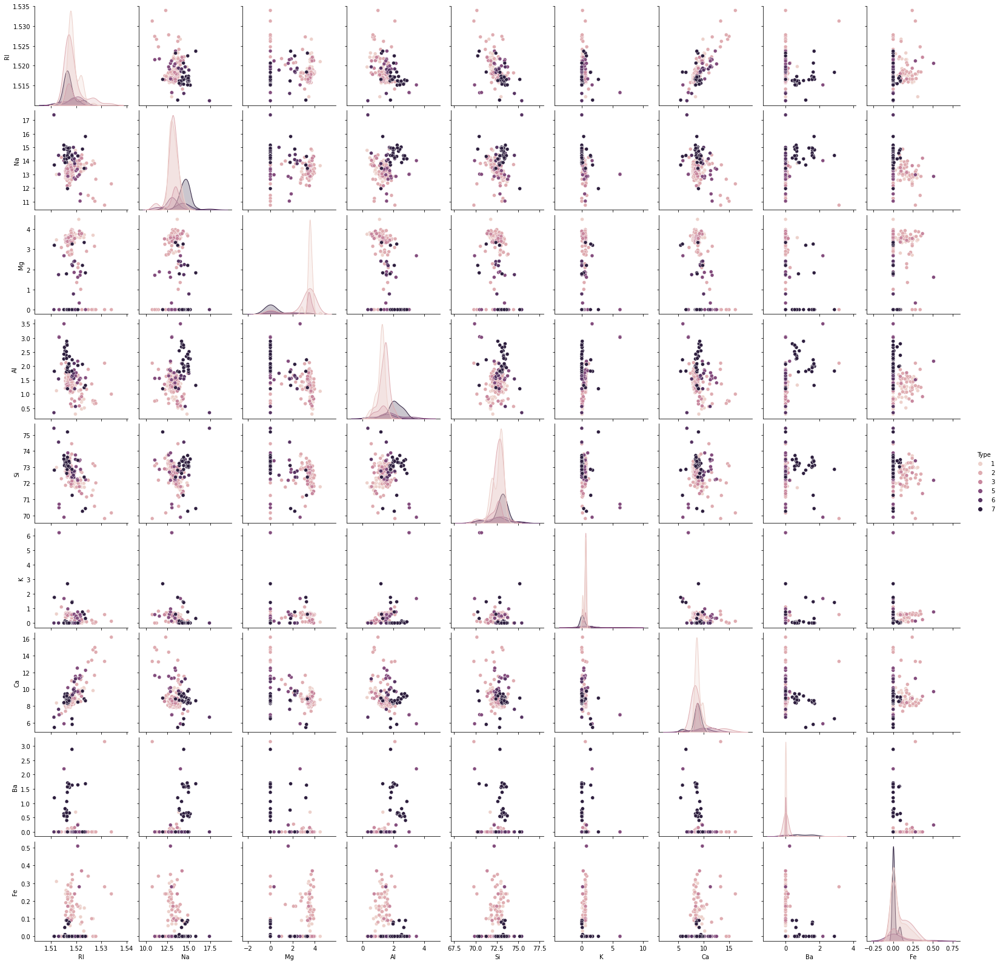

In [11]:
sns.pairplot(df, hue='Type')
plt.show()

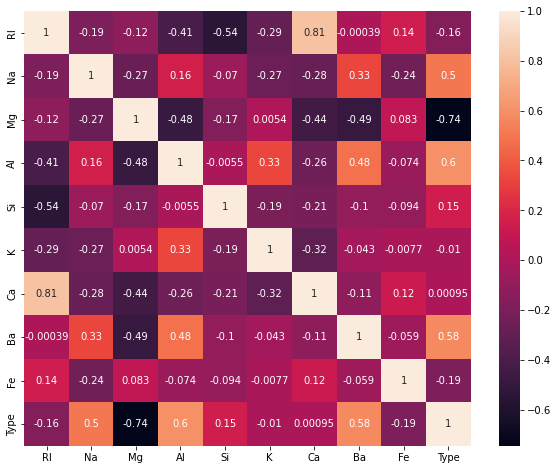

In [12]:
figure = plt.figure(figsize=(10,8))
heatmap = sns.heatmap(df.corr(), annot=True)
plt.show()

In [13]:
def normalize(df, feature):
    f_mean = df[feature].mean()
    f_std = df[feature].std()
    df[feature] = (df[feature]-f_mean)/f_std
    return df

In [14]:
for each in features:
    X = normalize(X, each)

In [15]:
X = pd.DataFrame(X)
X

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,0.870826,0.284287,1.251704,-0.690822,-1.124446,-0.670134,-0.145425,-0.352051,-0.585079
1,-0.248750,0.590433,0.634680,-0.170061,0.102080,-0.026152,-0.791877,-0.352051,-0.585079
2,-0.719631,0.149582,0.600016,0.190465,0.437760,-0.164148,-0.827010,-0.352051,-0.585079
3,-0.232286,-0.242285,0.697076,-0.310266,-0.052850,0.111844,-0.517838,-0.352051,-0.585079
4,-0.311315,-0.168810,0.648546,-0.410413,0.553957,0.081178,-0.623237,-0.352051,-0.585079
...,...,...,...,...,...,...,...,...,...
209,-0.703166,0.896579,-1.861147,2.874386,-0.052850,-0.639468,0.156721,1.779805,-0.585079
210,-0.499008,1.851755,-1.861147,1.091782,0.528136,-0.762132,-0.391358,2.845733,-0.585079
211,0.752282,1.165987,-1.861147,1.151869,0.992924,-0.762132,-0.363251,2.946292,-0.585079
212,-0.610966,1.190479,-1.861147,0.991635,1.238229,-0.762132,-0.335145,2.805509,-0.585079


## Implementing K-Means clustering algorithm on the dataset & Visualization

In [16]:
def kmeans_cluster_plot(X, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    label = kmeans.fit_predict(X)
    uniquelabels = np.unique(label)

    fig = plt.figure(figsize=(8, 5))
    
    Xnp = X.to_numpy()
    
    for each in uniquelabels:
        plt.scatter(Xnp[label == each, 0] , Xnp[label == each , 1] , label = each, alpha=0.7)
    plt.legend()

    centers = np.array(kmeans.cluster_centers_)
    plt.scatter(centers[:,0], centers[:,1], marker="x", color='black')
    plt.title(f'Number of clusters: {n_clusters}')

    plt.show()

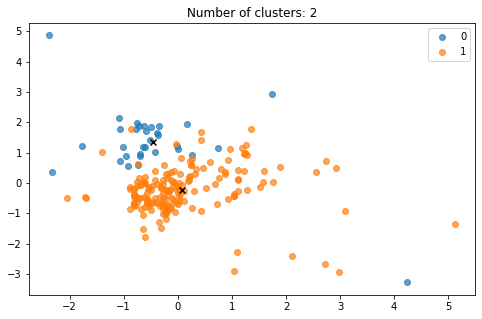

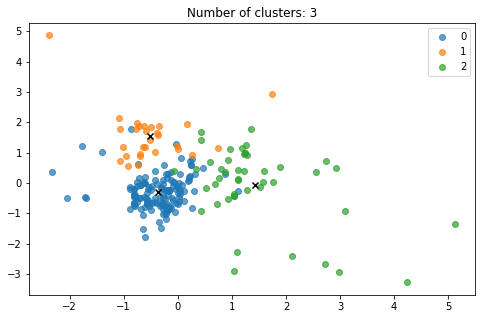

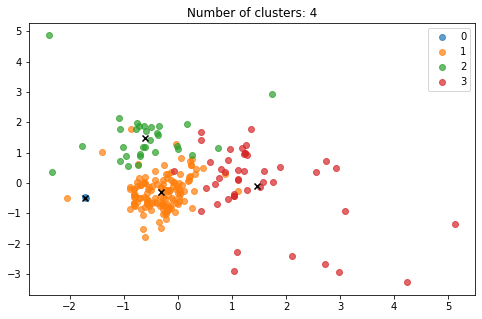

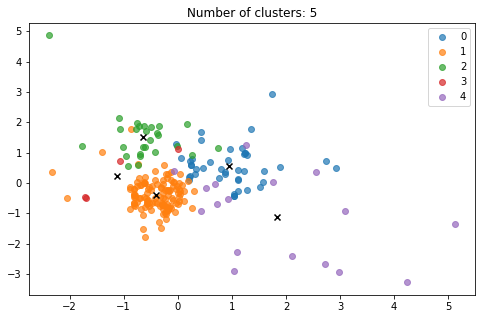

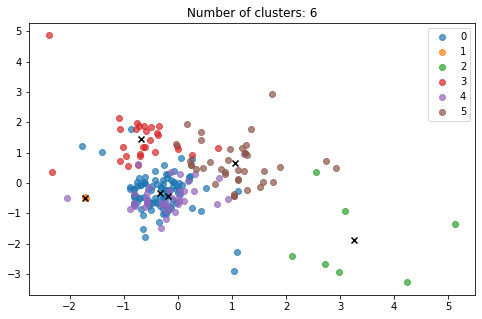

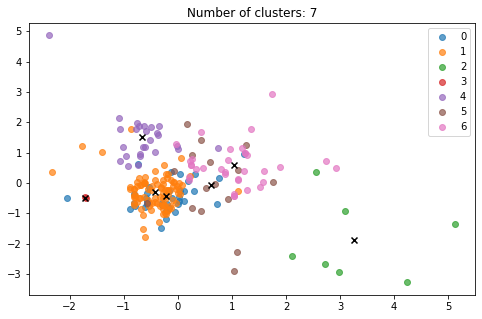

In [17]:
for each in range(2, 8):
    kmeans_cluster_plot(X, n_clusters=each)

## Finding optimal value of k using the Silhouette score

In [18]:
def kmeans_silhouette_score(X, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    label = kmeans.fit_predict(X)
    
    sscore = silhouette_score(X, label)
    
    return sscore

In [19]:
n_clusters_range = 15
n_clusters_array = []
sscore_array = []

best_sscore = 0
best_n_clusters = 2

for each in range(2, n_clusters_range+1):
    sscore = kmeans_silhouette_score(X, n_clusters=each)
    
    n_clusters_array.append(each)
    sscore_array.append(sscore)
    
    if sscore > best_sscore:
        best_sscore = sscore
        best_n_clusters = each
        
    print(f'silhouette score for n_clusters={each} is {sscore}')

silhouette score for n_clusters=2 is 0.41948052343085984
silhouette score for n_clusters=3 is 0.3671942443096343
silhouette score for n_clusters=4 is 0.3892164739151086
silhouette score for n_clusters=5 is 0.32754939788837634
silhouette score for n_clusters=6 is 0.3202040633950132
silhouette score for n_clusters=7 is 0.33708482197014084
silhouette score for n_clusters=8 is 0.3519334570540864
silhouette score for n_clusters=9 is 0.3591319401016944
silhouette score for n_clusters=10 is 0.35344272917653474
silhouette score for n_clusters=11 is 0.35837487922854944
silhouette score for n_clusters=12 is 0.2748312897570248
silhouette score for n_clusters=13 is 0.27244082101489425
silhouette score for n_clusters=14 is 0.2580347133099916
silhouette score for n_clusters=15 is 0.28858910243006525


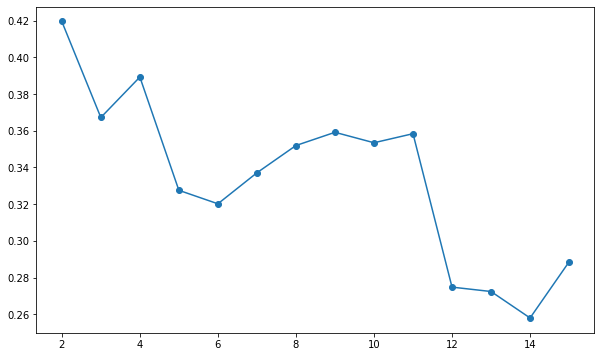

In [20]:
fig = plt.figure(figsize=(10,6))
plt.plot(n_clusters_array, sscore_array, 'o-')
plt.show()

In [21]:
best_n_clusters, best_sscore

(2, 0.41948052343085984)

## Elbow Method to find the optimal k value for k-means algorithm

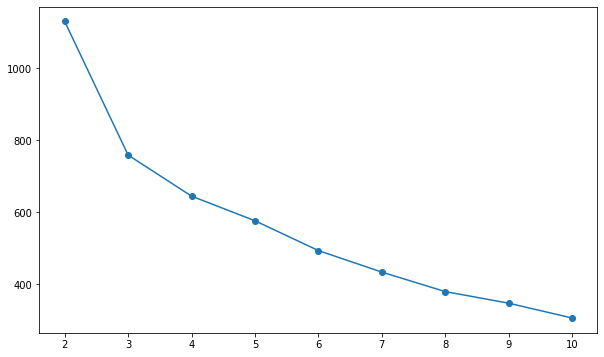

In [22]:
fig = plt.figure(figsize=(10,6))
# within clusters sum of squares
wcss = []
x_elbow = []

for n_clusters in range(2, 11):
    clustering = KMeans(n_clusters=n_clusters, random_state=0).fit(df)
    wcss.append(clustering.inertia_)
    x_elbow.append(n_clusters)
    
plt.plot(x_elbow, wcss, 'o-')
plt.show()

### Bagging with the KNN classifier as the base model

In [23]:
train_X, test_X, train_y, test_y = train_test_split(X, y, random_state=0)

In [24]:
def AccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors):
    knn_clf = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn_clf.fit(train_X, train_y)
    print('training accuracy:', knn_clf.score(train_X, train_y))
    print('testing accuracy:', knn_clf.score(test_X, test_y))

def BaggingAccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors):
    bagging_clf = BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=n_neighbors), random_state=0)
    bagging_clf.fit(train_X, train_y)
    print('training accuracy:', bagging_clf.score(train_X, train_y))
    print('testing accuracy:', bagging_clf.score(test_X, test_y))

### KNN Accuracies (without Bagging)

In [25]:
AccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors=1)

training accuracy: 1.0
testing accuracy: 0.7407407407407407


In [26]:
AccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors=2)

training accuracy: 0.8375
testing accuracy: 0.6666666666666666


In [27]:
AccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors=3)

training accuracy: 0.8375
testing accuracy: 0.7037037037037037


### Bagging Accuracies

In [28]:
BaggingAccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors=1)

training accuracy: 0.98125
testing accuracy: 0.7222222222222222


In [29]:
BaggingAccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors=2)

training accuracy: 0.91875
testing accuracy: 0.7962962962962963


In [30]:
BaggingAccuracyKNN(train_X, train_y, test_X, test_y, n_neighbors=3)

training accuracy: 0.83125
testing accuracy: 0.7407407407407407


---
# Question-2
---

In [31]:
from collections import Counter

## Implementation of K-Means Algorithm from scratch

In [32]:
class KMeansAlgo:
    def __init__(self, k=8, max_iter=300, user_centroids=None, random_state=None):
        '''
        Inputs:-
        k = number of clusters
        max_iter = maximum number of iterations
        user_centroids = custom cluster centroids initialised by the user
        
        Constructor method for the K-Means Algorithm
        Also initialises the cluster centroids, current iteration number
        '''
        self.k = k
        self.max_iter = max_iter
        self.random_state = random_state
        
        if user_centroids is None:
            self.cluster_centroids = None
        else:
            self.cluster_centroids = dict()
            for z in range(k):
                self.cluster_centroids[z] = user_centroids[z]
            
        self.current_iter = 0
        self.sse_error = 0
    
    
    def fit(self, train_X):
        '''
        Input: training dataset
        
        Trains the clustering model by manipulating and storing the cluster centers
        based on the number of iterations and comparision of euclidean distances of the datapoints
        '''
        train_X = train_X.to_numpy()
        train_X_df = pd.DataFrame(train_X)
        
        prev_clusters = dict()
        prev_centroids = dict()
        prev_sse_error = None
        
        if self.cluster_centroids is None:
            centroids = train_X_df.sample(n=self.k, random_state=self.random_state).to_numpy()
            self.cluster_centroids = dict()
            for z in range(self.k):
                self.cluster_centroids[z] = centroids[z]
            
        while not self.convergence():
            self.clusters = dict()
            for z in range(self.k):
                self.clusters[z] = list()

            for datapoint in train_X:
                cluster = self.compare_distances(datapoint)
                self.clusters[cluster].append(datapoint)
                
            for each in range(self.k):
                self.cluster_centroids[each] = np.mean(self.clusters[each], axis=0)
            
            self.sse_error = self.sse()
            
            if self.current_iter != 0:
                '''
                if self.sse_error == prev_sse_error:
                    print(f'sse not changing, converged after {self.current_iter+1} iterations')
                    break
                '''
                #'''         
                check = self.k
                for each in range(self.k):
                    if Counter(self.cluster_centroids[each]) == Counter(prev_centroids[each]):
                        check -= 1
                if check == 0:
                    print(f'centroids not changing, converged after {self.current_iter+1} iterations')
                    break
                #'''
                    
            prev_clusters = self.clusters
            prev_centroids = self.cluster_centroids.copy()
            prev_sse_error = self.sse_error.copy()
            
            self.current_iter += 1
        
        self.cluster_centroids = prev_centroids
        self.sse_error = prev_sse_error
    
    
    def compare_distances(self, datapoint):
        '''
        Input: datapoint
        
        Compares the euclidean distances of the datapoint from all the cluster centroids
        Returns the class of the cluster from the centroid of which the euclidean distance is the minimum
        '''
        distances = dict()
        
        for each in self.cluster_centroids.keys():
            distances[each] = self.euclidean_distance(datapoint, self.cluster_centroids[each])
        
        keymin = min(zip(distances.values(), distances.keys()))[1]
        return keymin
    
    
    def euclidean_distance(self, datapoint, centroid):
        '''
        Input: datapoint, centroid datapoint
        
        Returns the euclidean distance of the datapoint from the centroid
        '''
        return np.linalg.norm(np.array(datapoint) - np.array(centroid))


    def convergence(self):
        '''
        Checks the condition of convergence
        (maximum number of iterations is reached)
        (implemented in the fit method: cluster centers are not changing anymore)
        '''
        if self.current_iter >= self.max_iter - 1:
            return True
        return False
    
    
    def sse(self):
        '''
        Returns Sum of Squared Error
        '''
        error = 0
        for each in range(self.k):
            for datapoint in self.clusters[each]:
                error += self.euclidean_distance(datapoint, self.cluster_centroids[each])**2
        
        return error
    
    
    def predict(self, test_X):
        '''
        Input: single test datapoint
        
        Returns the class of the cluster to which the datapoint belongs
        (based on the distances from the cluster centroids)
        '''
        return self.compare_distances(test_X)


In [33]:
olivetti_dataset = fetch_olivetti_faces()

In [34]:
olivetti_X = olivetti_dataset.data

In [35]:
olivetti_y = olivetti_dataset.target

In [36]:
olivetti_X.shape

(400, 4096)

In [37]:
olivetti_y.shape

(400,)

In [38]:
olivetti_X = pd.DataFrame(olivetti_X)

In [39]:
olivetti_df = olivetti_X.copy()
olivetti_df['label'] = olivetti_y

In [40]:
olivetti_df

,0,1,2,3,4,5,6,7,8,9,...,4087,4088,4089,4090,4091,4092,4093,4094,4095,label
0,0.309917,0.367769,0.417355,0.442149,0.528926,0.607438,0.657025,0.677686,0.690083,0.685950,...,0.669421,0.652893,0.661157,0.475207,0.132231,0.148760,0.152893,0.161157,0.157025,0
1,0.454545,0.471074,0.512397,0.557851,0.595041,0.640496,0.681818,0.702479,0.710744,0.702479,...,0.157025,0.136364,0.148760,0.152893,0.152893,0.152893,0.152893,0.152893,0.152893,0
2,0.318182,0.400826,0.491736,0.528926,0.586777,0.657025,0.681818,0.685950,0.702479,0.698347,...,0.132231,0.181818,0.136364,0.128099,0.148760,0.144628,0.140496,0.148760,0.152893,0
3,0.198347,0.194215,0.194215,0.194215,0.190083,0.190083,0.243802,0.404959,0.483471,0.516529,...,0.636364,0.657025,0.685950,0.727273,0.743802,0.764463,0.752066,0.752066,0.739669,0
4,0.500000,0.545455,0.582645,0.623967,0.648760,0.690083,0.694215,0.714876,0.723140,0.731405,...,0.161157,0.177686,0.173554,0.177686,0.177686,0.177686,0.177686,0.173554,0.173554,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.400826,0.495868,0.570248,0.632231,0.648760,0.640496,0.661157,0.636364,0.665289,0.698347,...,0.396694,0.264463,0.099174,0.181818,0.243802,0.247934,0.161157,0.157025,0.136364,39
396,0.367769,0.367769,0.351240,0.301653,0.247934,0.247934,0.367769,0.512397,0.574380,0.628099,...,0.334711,0.289256,0.285124,0.338843,0.404959,0.458678,0.487603,0.512397,0.549587,39
397,0.500000,0.533058,0.607438,0.628099,0.657025,0.632231,0.657025,0.669421,0.673554,0.702479,...,0.148760,0.152893,0.161157,0.161157,0.173554,0.157025,0.177686,0.148760,0.190083,39
398,0.214876,0.219008,0.219008,0.223140,0.210744,0.202479,0.276859,0.400826,0.487603,0.549587,...,0.392562,0.367769,0.409091,0.479339,0.524793,0.545455,0.574380,0.590909,0.603306,39


## Training the implemened model by selecting 40 random 4096 dimensional points as initializations

In [41]:
random_points = olivetti_X.sample(n=40, random_state=0).to_numpy()

In [42]:
scratch1 = KMeansAlgo(k=40, max_iter=300, user_centroids=random_points, random_state=0)
scratch1.fit(olivetti_X)

centroids not changing, converged after 8 iterations


In [43]:
scratch1.sse_error

13038.559373050439

In [44]:
scratch1_clusters_dict = {}
for num in range(scratch1.k):
    scratch1_clusters_dict[f'Cluster-{num+1}'] = len(scratch1.clusters[num])
    print(f'Number of points in cluster-{num+1}:', len(scratch1.clusters[num]))
print()
print(scratch1_clusters_dict)

Number of points in cluster-1: 9
Number of points in cluster-2: 2
Number of points in cluster-3: 6
Number of points in cluster-4: 4
Number of points in cluster-5: 29
Number of points in cluster-6: 11
Number of points in cluster-7: 2
Number of points in cluster-8: 8
Number of points in cluster-9: 13
Number of points in cluster-10: 30
Number of points in cluster-11: 4
Number of points in cluster-12: 6
Number of points in cluster-13: 7
Number of points in cluster-14: 3
Number of points in cluster-15: 6
Number of points in cluster-16: 7
Number of points in cluster-17: 22
Number of points in cluster-18: 10
Number of points in cluster-19: 14
Number of points in cluster-20: 4
Number of points in cluster-21: 5
Number of points in cluster-22: 2
Number of points in cluster-23: 9
Number of points in cluster-24: 12
Number of points in cluster-25: 21
Number of points in cluster-26: 9
Number of points in cluster-27: 2
Number of points in cluster-28: 4
Number of points in cluster-29: 10
Number of poi

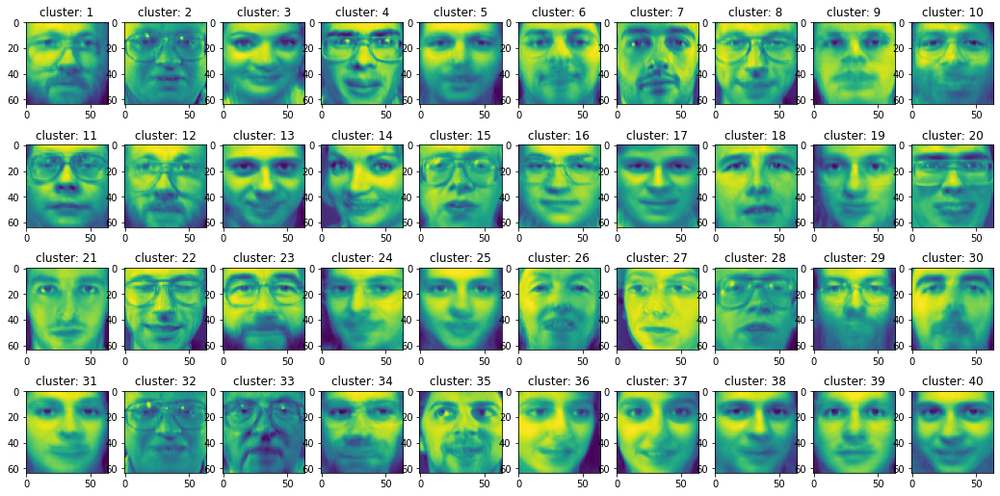

In [45]:
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
counter = 0
for each in range(scratch1.k):
    axarr[counter].imshow((scratch1.cluster_centroids[each].reshape(64,64)))
    axarr[counter].set_title(f'cluster: {each+1}')
    counter += 1                 
plt.show()

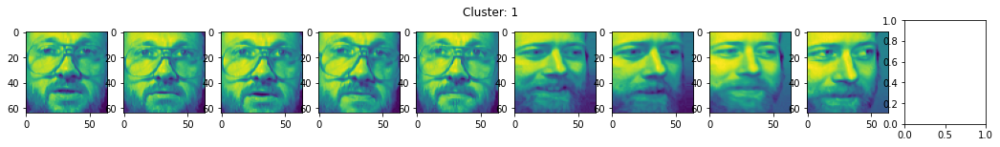

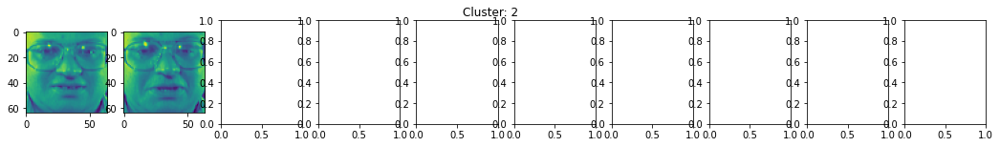

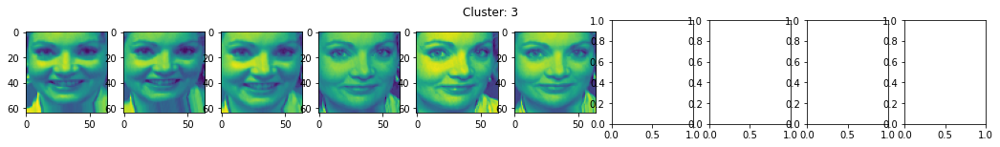

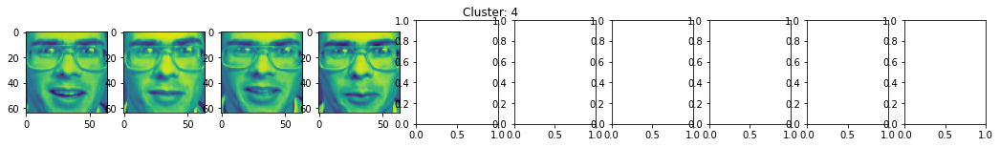

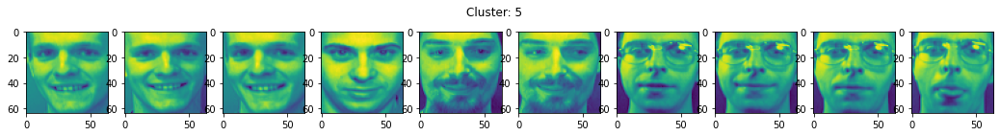

...

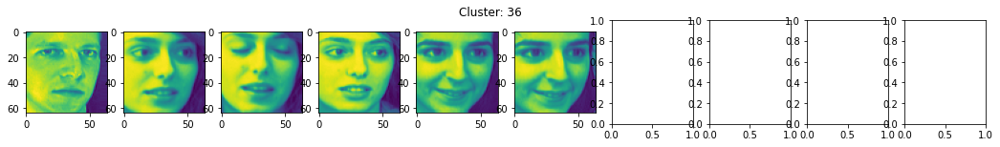

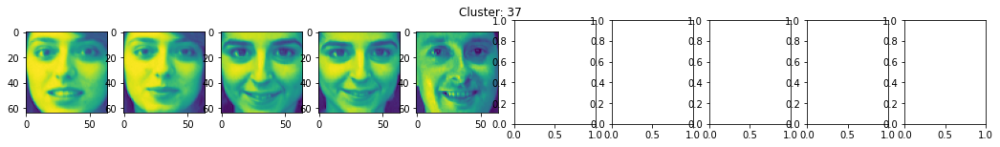

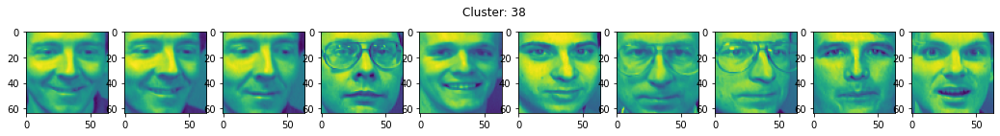

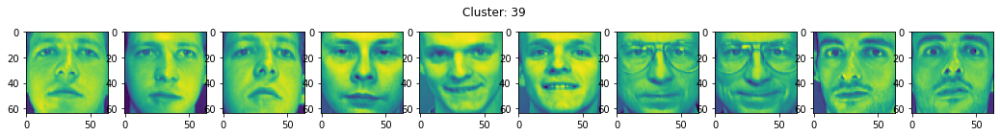

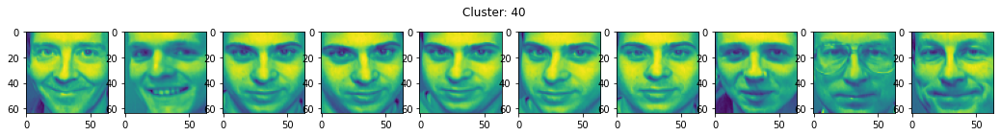

In [46]:
for num in range(scratch1.k):
    fig, axarr=plt.subplots(nrows=1, ncols=10, figsize=(18, 2))
    axarr=axarr.flatten()
    counter = 0
    for each in range(len(scratch1.clusters[num])):
        axarr[counter].imshow((scratch1.clusters[num][each].reshape(64,64)))
        counter += 1
        if(counter > 9):
            break
    plt.suptitle(f'Cluster: {num+1}')
    plt.show()

## Training the implemented model by selecting 40 images from each class as initializations

In [47]:
random_points = []
for num in range(40):
    random_points.append(olivetti_X[olivetti_df['label']==num].sample(n=1, random_state=0).to_numpy())

In [48]:
scratch2 = KMeansAlgo(k=40, max_iter=300, user_centroids=random_points, random_state=0)
scratch2.fit(olivetti_X)

centroids not changing, converged after 10 iterations


In [49]:
scratch2.sse_error

12481.960467895084

In [50]:
scratch2_clusters_dict = {}
for num in range(scratch2.k):
    scratch2_clusters_dict[f'Cluster-{num+1}'] = len(scratch2.clusters[num])
    print(f'Number of points in cluster-{num+1}:', len(scratch2.clusters[num]))
print()
print(scratch2_clusters_dict)

Number of points in cluster-1: 10
Number of points in cluster-2: 10
Number of points in cluster-3: 8
Number of points in cluster-4: 5
Number of points in cluster-5: 10
Number of points in cluster-6: 10
Number of points in cluster-7: 3
Number of points in cluster-8: 7
Number of points in cluster-9: 7
Number of points in cluster-10: 8
Number of points in cluster-11: 15
Number of points in cluster-12: 5
Number of points in cluster-13: 23
Number of points in cluster-14: 10
Number of points in cluster-15: 17
Number of points in cluster-16: 11
Number of points in cluster-17: 6
Number of points in cluster-18: 12
Number of points in cluster-19: 5
Number of points in cluster-20: 4
Number of points in cluster-21: 16
Number of points in cluster-22: 13
Number of points in cluster-23: 11
Number of points in cluster-24: 9
Number of points in cluster-25: 28
Number of points in cluster-26: 11
Number of points in cluster-27: 10
Number of points in cluster-28: 5
Number of points in cluster-29: 10
Number

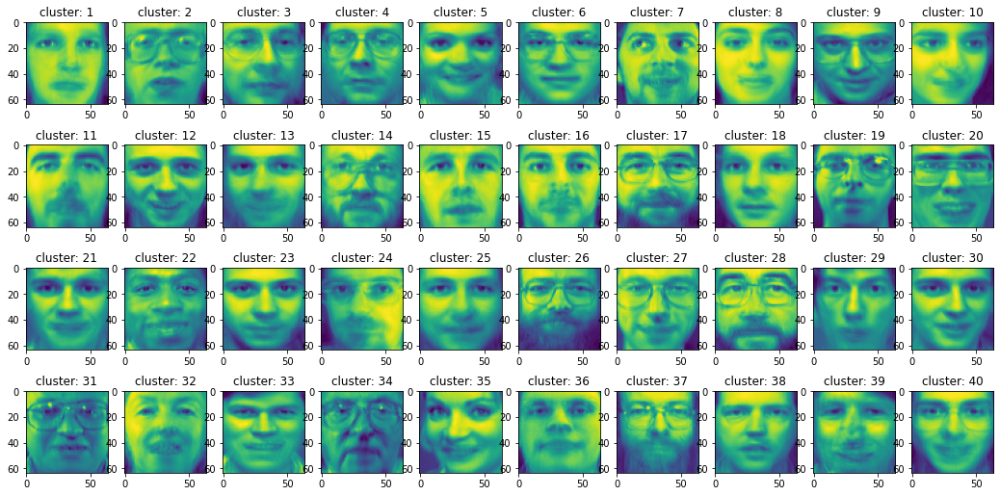

In [51]:
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
counter = 0
for each in range(scratch2.k):
    axarr[counter].imshow((scratch2.cluster_centroids[each].reshape(64,64)))
    axarr[counter].set_title(f'cluster: {each+1}')
    counter += 1                 
plt.show()

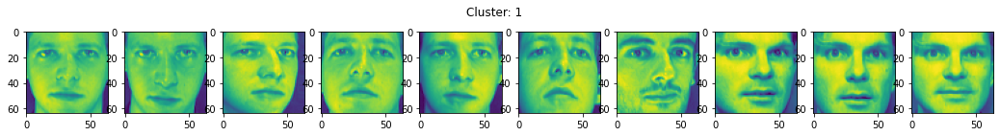

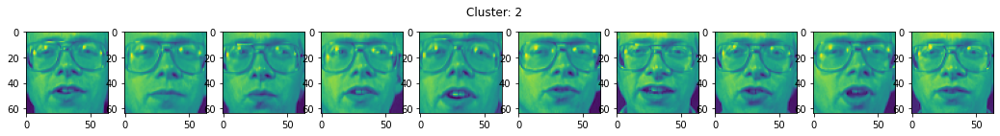

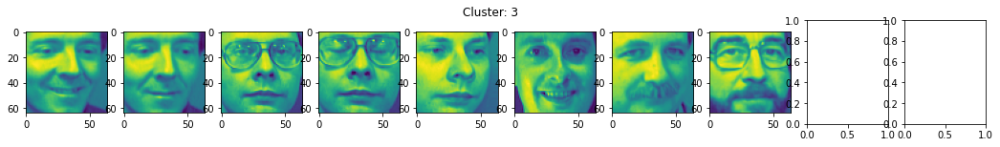

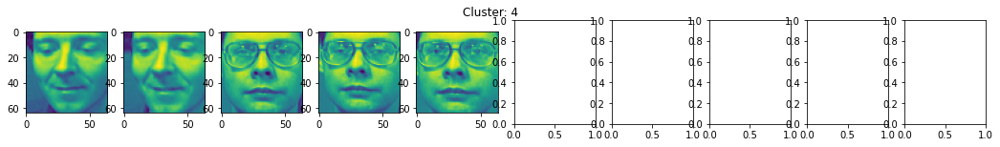

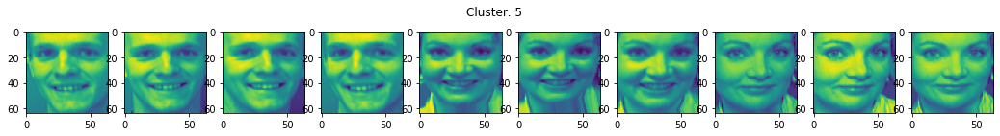

...

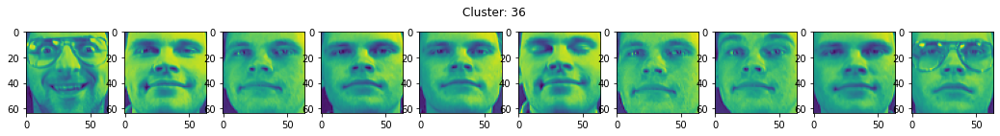

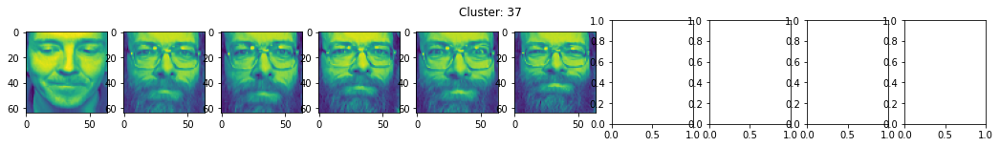

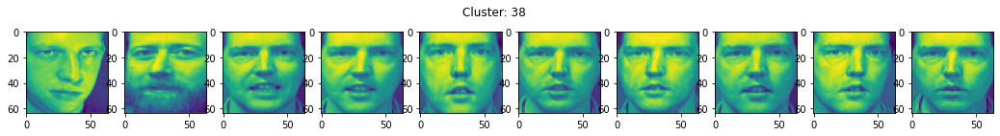

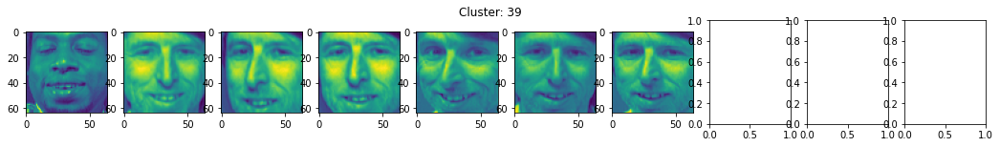

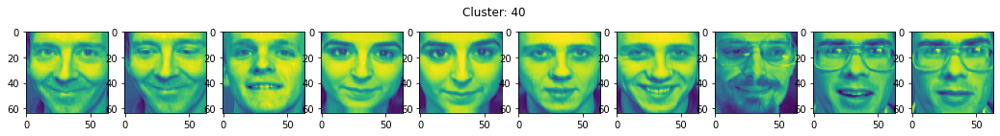

In [52]:
for num in range(scratch2.k):
    fig, axarr=plt.subplots(nrows=1, ncols=10, figsize=(18, 2))
    axarr=axarr.flatten()
    counter = 0
    for each in range(len(scratch2.clusters[num])):
        axarr[counter].imshow((scratch2.clusters[num][each].reshape(64,64)))
        counter += 1
        if(counter > 9):
            break
    plt.suptitle(f'Cluster: {num+1}')
    plt.show()

---
# Question-3
---

## Preprocessing and Data Analysis

In [53]:
customers_df = pd.read_csv('Wholesale customers data.csv')

In [54]:
customers_df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
...,...,...,...,...,...,...,...,...
435,1,3,29703,12051,16027,13135,182,2204
436,1,3,39228,1431,764,4510,93,2346
437,2,3,14531,15488,30243,437,14841,1867
438,1,3,10290,1981,2232,1038,168,2125


In [55]:
customers_df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicassen']

In [56]:
customers_df.isnull().sum()

Channel             0
Region              0
Fresh               0
Milk                0
Grocery             0
Frozen              0
Detergents_Paper    0
Delicassen          0
dtype: int64

In [57]:
for each in customers_df.columns:
    print('Number of unique entries in', each, ':', len(customers_df[each].unique()))

Number of unique entries in Channel : 2
Number of unique entries in Region : 3
Number of unique entries in Fresh : 433
Number of unique entries in Milk : 421
Number of unique entries in Grocery : 430
Number of unique entries in Frozen : 426
Number of unique entries in Detergents_Paper : 417
Number of unique entries in Delicassen : 403


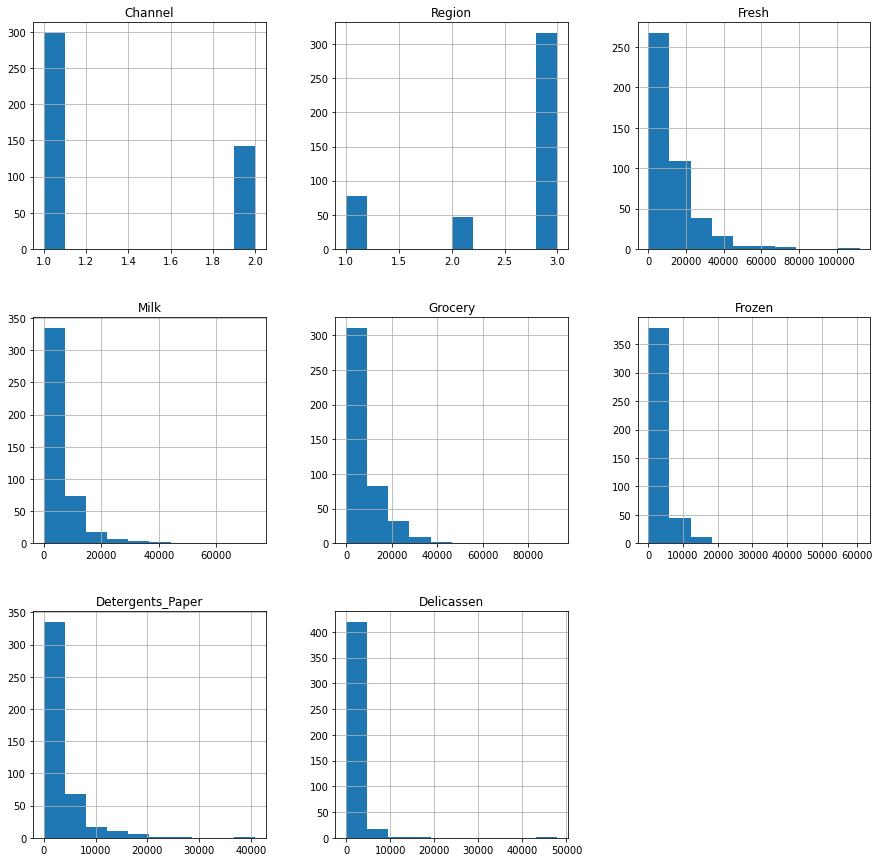

In [58]:
customers_df.hist(figsize=(15,15))
plt.show()

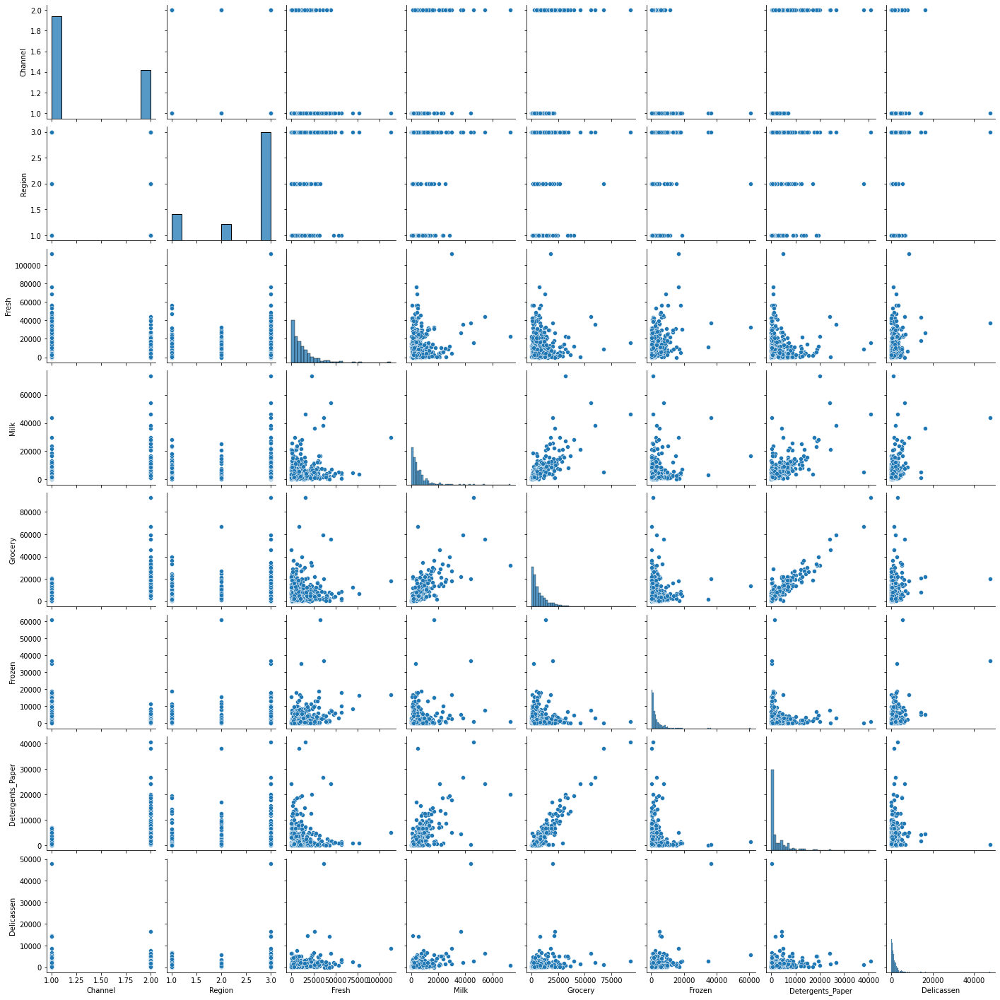

In [59]:
sns.pairplot(customers_df)
plt.show()

In [60]:
customers_noncat_features = ['Fresh','Milk','Grocery','Frozen','Detergents_Paper','Delicassen']
customers_cat_features = ['Channel', 'Region']

In [61]:
for each in customers_noncat_features:
    customers_df = normalize(customers_df, each)

In [62]:
for each in customers_cat_features:
    customers_df = normalize(customers_df, each)

## Covariance Heatmap

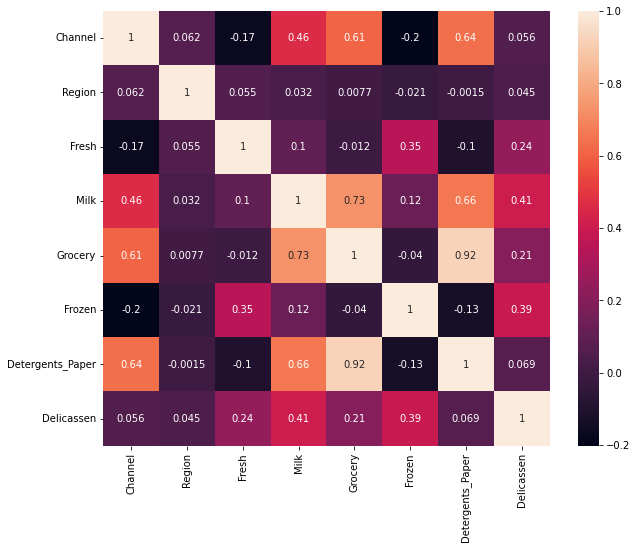

In [63]:
figure = plt.figure(figsize=(10,8))
heatmap = sns.heatmap(customers_df.cov(), annot=True)
plt.show()

## Visualization for the outliers

In [64]:
def mahalanobis_distance(df):
    mu = df - np.mean(df)
    inv_covmat = np.linalg.inv(np.cov(df.values.T))
    md = np.dot(mu, inv_covmat)
    md = np.dot(md, mu.T)
    return md.diagonal()

In [65]:
customers_df['mahalanobis distance'] = mahalanobis_distance(customers_df)

In [66]:
customers_df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,mahalanobis distance
0,1.447005,0.589997,0.052873,0.522972,-0.041068,-0.588697,-0.043519,-0.066264,4.761740
1,1.447005,0.589997,-0.390857,0.543839,0.170125,-0.269829,0.086309,0.089050,3.846074
2,1.447005,0.589997,-0.446521,0.408073,-0.028125,-0.137379,0.133080,2.240742,11.077375
3,-0.689512,0.589997,0.099998,-0.623310,-0.392530,0.686363,-0.498021,0.093305,1.673383
4,1.447005,0.589997,0.839284,-0.052337,-0.079266,0.173661,-0.231654,1.297870,7.493275
...,...,...,...,...,...,...,...,...,...
435,-0.689512,0.589997,1.399719,0.847482,0.849793,2.072862,-0.566186,0.240817,18.760954
436,-0.689512,0.589997,2.152842,-0.591469,-0.756304,0.296223,-0.584853,0.291170,6.520795
437,1.447005,0.589997,0.200098,1.313176,2.345716,-0.542762,2.508362,0.121318,7.339127
438,-0.689512,0.589997,-0.135230,-0.516947,-0.601829,-0.418964,-0.569122,0.212804,1.586488


In [67]:
threshold = np.mean(customers_df['mahalanobis distance']) * 0.5

In [68]:
features = customers_df.columns.tolist()[:-1]

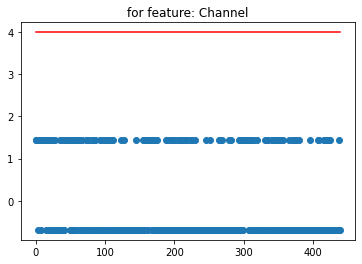

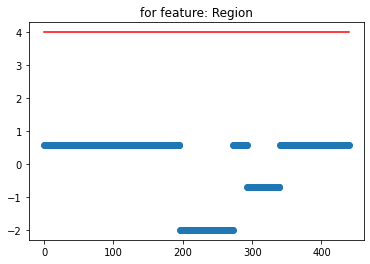

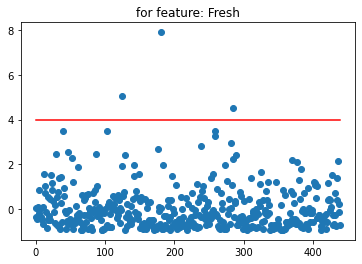

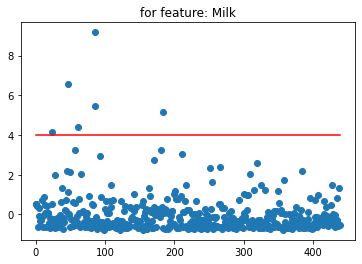

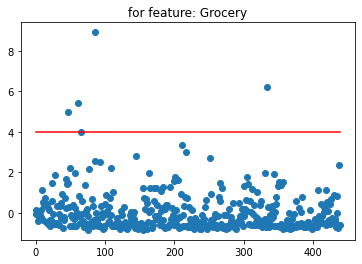

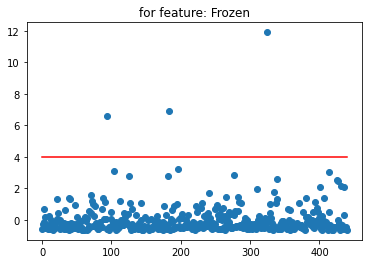

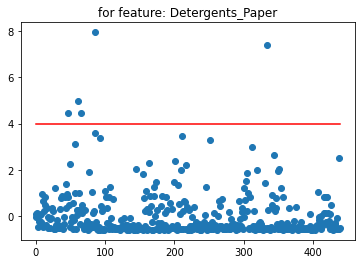

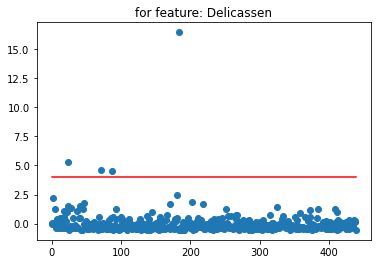

In [69]:
for f in features:
    x = [x for x in range(len(customers_df[f]))]
    y = customers_df[f].to_numpy()
    t = threshold*np.ones(len(customers_df[f]))
    plt.scatter(x, y)
    plt.plot(x, t, 'r')
    plt.title(f'for feature: {f}')
    plt.show()

## Outliers Visualization

In [70]:
customers_df['outliers'] = customers_df['mahalanobis distance'] > threshold

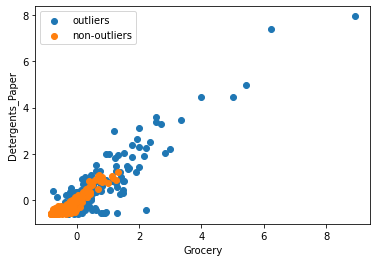

In [71]:
outliers = customers_df[customers_df['outliers']==True].copy()
non_outliers = customers_df[customers_df['outliers']==False].copy()

plt.scatter(outliers['Grocery'], outliers['Detergents_Paper'], label='outliers')
plt.scatter(non_outliers['Grocery'], non_outliers['Detergents_Paper'], label='non-outliers')
plt.legend()
plt.xlabel('Grocery')
plt.ylabel('Detergents_Paper')

plt.show()

## DBSCAN clustering on the dataset

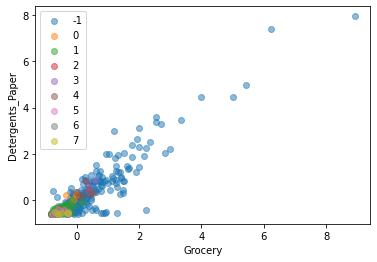

In [72]:
clustering = DBSCAN().fit(customers_df[features])
labels = clustering.labels_
uniquelabels = np.unique(labels)
for each in uniquelabels:
    plt.scatter(x=customers_df['Grocery'].to_numpy()[labels==each], y=customers_df['Detergents_Paper'].to_numpy()[labels==each], label=each, alpha=0.5)
    plt.xlabel('Grocery')
    plt.ylabel('Detergents_Paper')
plt.legend()
plt.show()

## KMeans on the dataset

In [73]:
customers_df = pd.read_csv('Wholesale customers data.csv')
for each in customers_noncat_features:
    customers_df = normalize(customers_df, each)

In [74]:
customers_X = customers_df[['Channel','Fresh','Milk','Grocery','Frozen','Detergents_Paper','Delicassen']].copy()
customers_y = customers_df['Region'].copy()

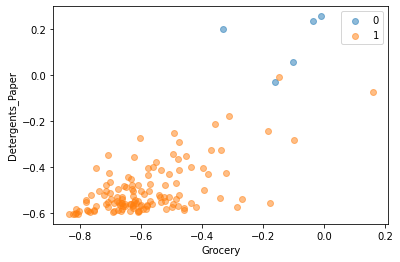

In [75]:
kmeans = KMeans(n_clusters=2).fit(customers_X)
uniquelabels = np.unique(kmeans.predict(customers_X))
for each in uniquelabels:
    plt.scatter(x=customers_df['Grocery'].to_numpy()[labels==each], y=customers_df['Detergents_Paper'].to_numpy()[labels==each], label=each, alpha=0.5)
    plt.xlabel('Grocery')
    plt.ylabel('Detergents_Paper')
plt.legend()
plt.show()

## DBSCAN & KMeans clustering on the make_moons dataset

In [76]:
moons_X, moons_y = make_moons(n_samples=2000, noise=0.2)

In [77]:
moons_X = pd.DataFrame(moons_X)
moons_X.columns = ['feature-1', 'feature-2']

In [78]:
def dbscan_moons_plot(moons_X=moons_X, eps=0.5, min_samples=5):
    moons_dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(moons_X)
    labels = moons_dbscan.labels_
    uniquelabels = np.unique(labels)
    for each in uniquelabels:
        plt.scatter(x=moons_X['feature-1'].to_numpy()[labels==each], y=moons_X['feature-2'].to_numpy()[labels==each], label=each, alpha=0.5)
        plt.xlabel('feature-1')
        plt.ylabel('feature-2')
    plt.title(f'for eps={round(eps, 2)}, min_samples={min_samples}')
    plt.legend()
    plt.show()

### Hit-&-Trial Loop

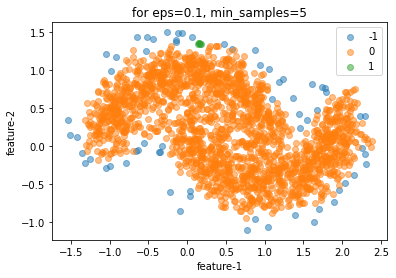

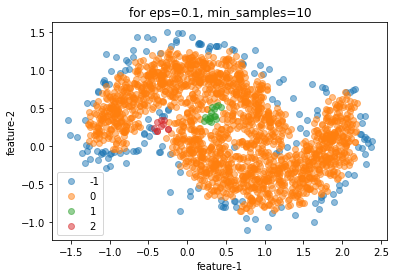

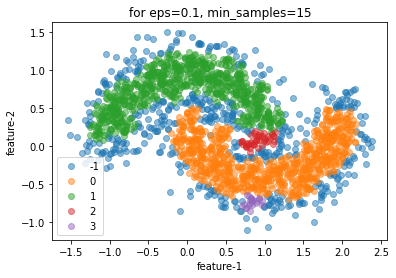

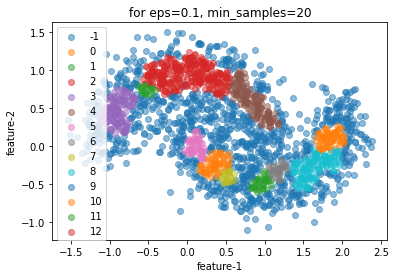

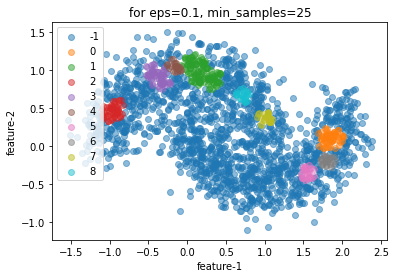

...

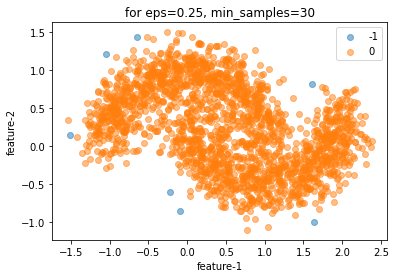

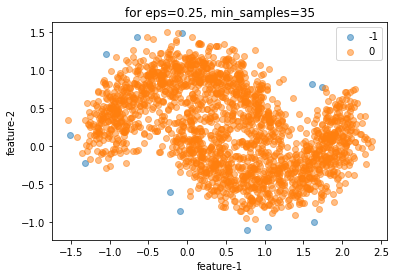

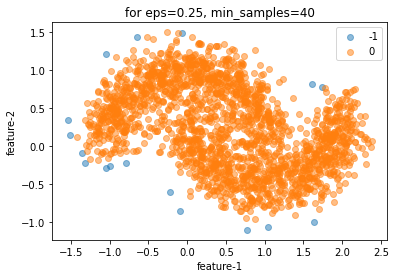

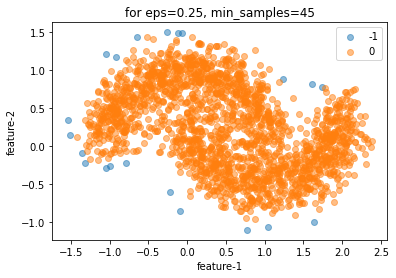

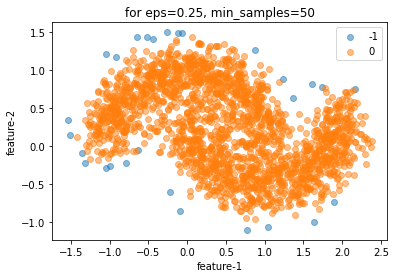

In [79]:
for e in range(2,6):
    for ms in range(5, 51, 5):
        dbscan_moons_plot(eps=0.05*e, min_samples=ms)

---

## DBSCAN Visualization

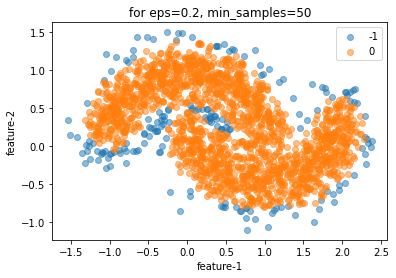

In [80]:
dbscan_moons_plot(eps=0.2, min_samples=50)

---

In [81]:
def kmeans_moons_plot(moons_X=moons_X, n_clusters=8):
    moons_kmeans = KMeans(n_clusters=n_clusters).fit(moons_X)
    label = moons_kmeans.predict(moons_X)
    uniquelabels = np.unique(label)
    for each in uniquelabels:
        plt.scatter(moons_X['feature-1'].to_numpy()[label==each], y=moons_X['feature-2'].to_numpy()[label==each], label=each, alpha=0.5)
        plt.xlabel('feature-1')
        plt.ylabel('feature-2')
    plt.legend()
    plt.title(f'for n_clusters={n_clusters}')
    plt.show()

### Hit-&-Trial Loop

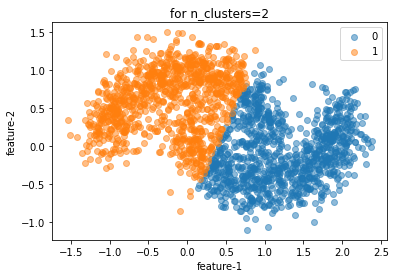

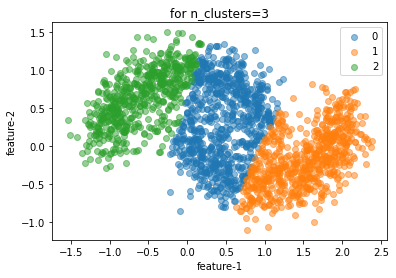

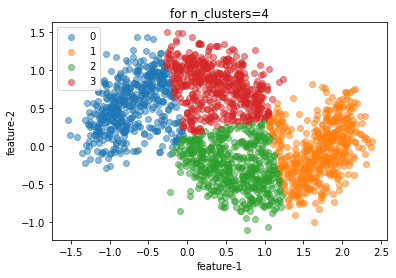

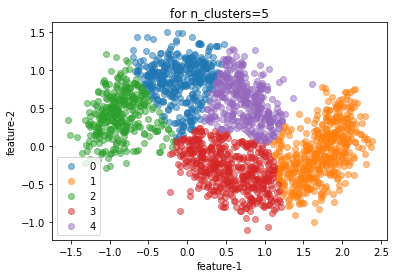

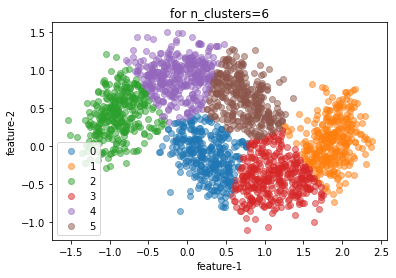

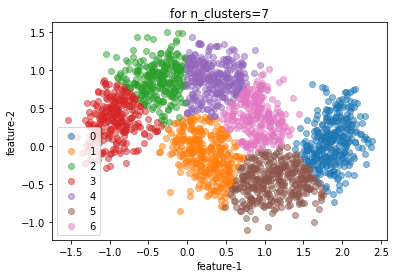

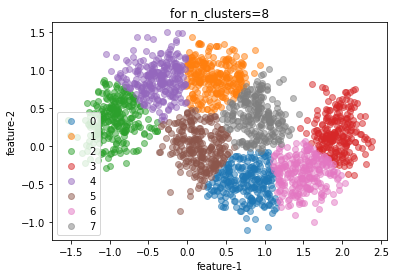

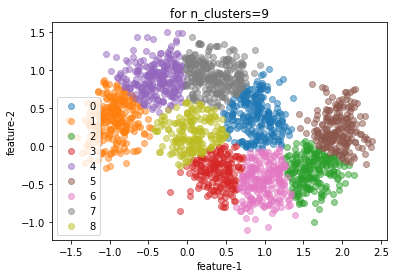

In [82]:
for n in range(2, 10):
    kmeans_moons_plot(n_clusters=n)

---

## KMeans Visualization

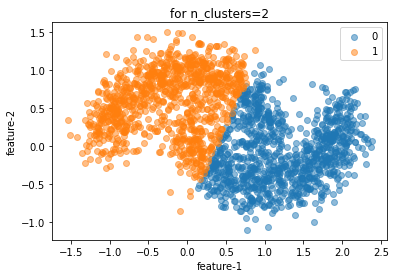

In [83]:
kmeans_moons_plot(n_clusters=2)

---